In [1]:
import re
import bisect
import numpy as np 
import pandas as pd
from pyedflib import highlevel
import matplotlib.pyplot as plt

from source.utils import PPG_peakdetection

## Import data

In [2]:
%%time
edf_path = '/Users/matthewliu/PranaQ/database/LK/severe/20130809-21666668-1328-CGMHLinKou/A0001328.edf'
signals, signal_headers, header = highlevel.read_edf(edf_path)
ppg = signals[18]
Fs = 200

CPU times: user 8.03 s, sys: 1.17 s, total: 9.2 s
Wall time: 9.67 s


## R peak and Q point detecion via PPG

In [3]:
%%time
R, Q = PPG_peakdetection(ppg, Fs)

CPU times: user 6.56 s, sys: 637 ms, total: 7.2 s
Wall time: 7.2 s


## Visualization

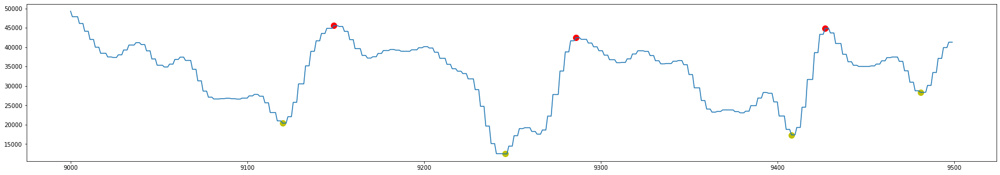

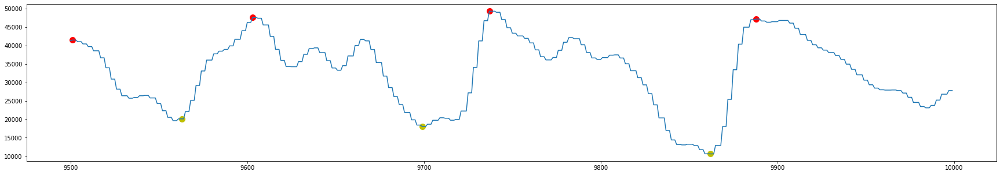

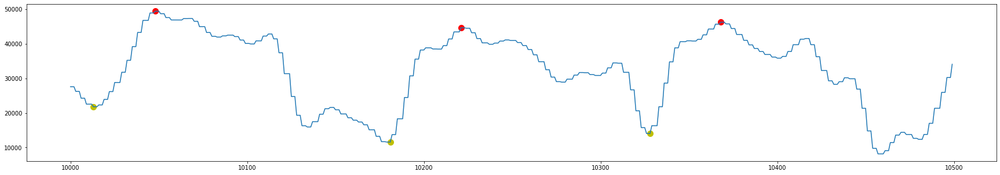

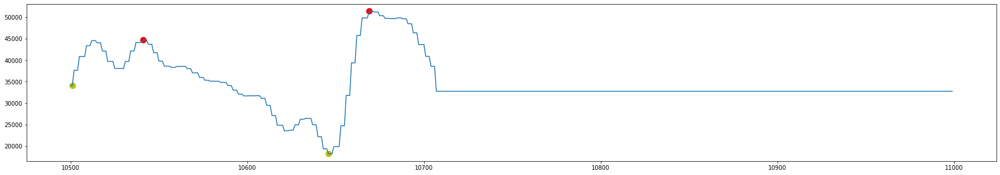

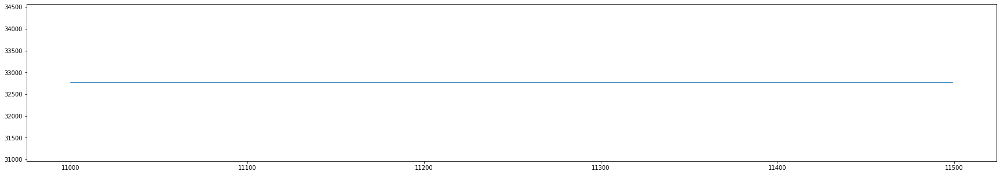

...

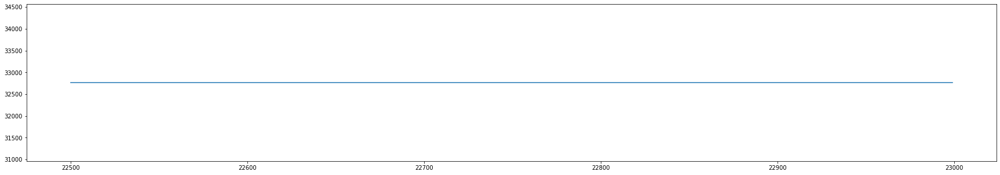

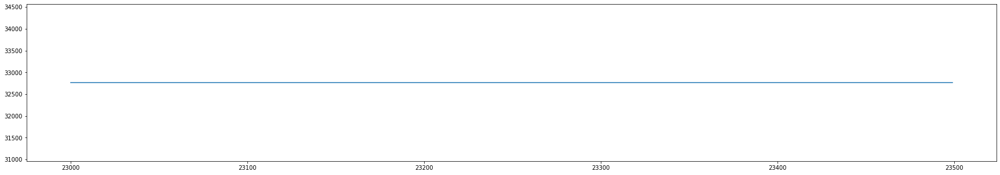

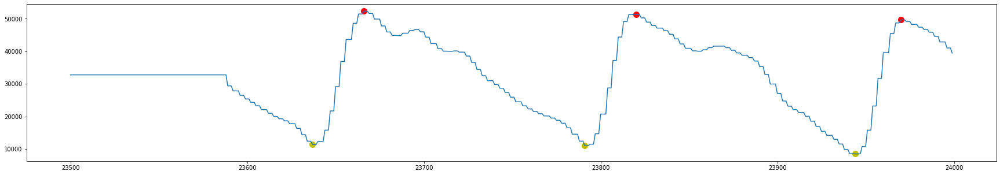

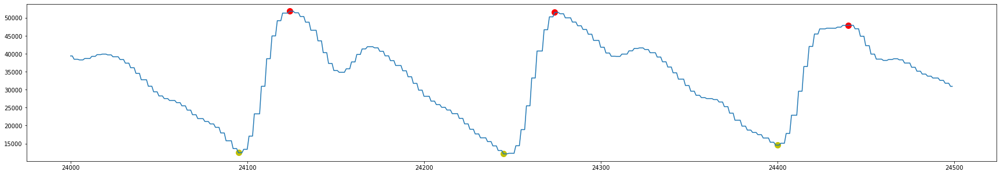

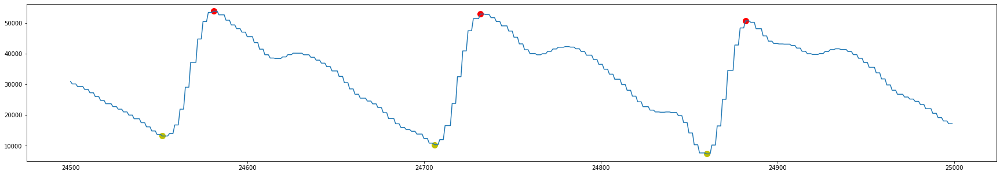

In [7]:
k = [n for n in range(9000, 25001, 500)]

for start, end in zip(k[:-1], k[1:]):
    sR = bisect.bisect_left(R, start)
    eR = bisect.bisect_left(R, end)

    # Peak label
    xPeak = R[sR:eR].astype(int)
    yPeak = ppg[xPeak]
    
    sQ = bisect.bisect_left(Q, start)
    eQ = bisect.bisect_left(Q, end)

    # Q point label
    xPoint = Q[sQ:eQ].astype(int)
    yPoint = ppg[xPoint]

    plt.figure(figsize=(30,5))
    plt.scatter(xPeak, yPeak, c='r', s=100)
    plt.scatter(xPoint, yPoint, c='y', s=100)
    plt.plot([n for n in range(start, end)],  ppg[start:end])
    plt.show()

## Instantaneous Heart Rate

In [5]:
def IHR(r1, r2):
    return 1/(r2-r1)

HRVfun = np.vectorize(IHR)
HRV = HRVfun(R[:-1], R[1:])

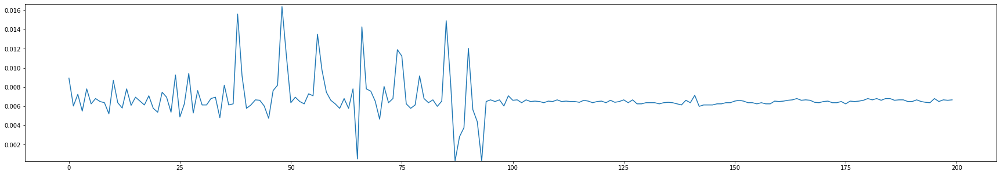

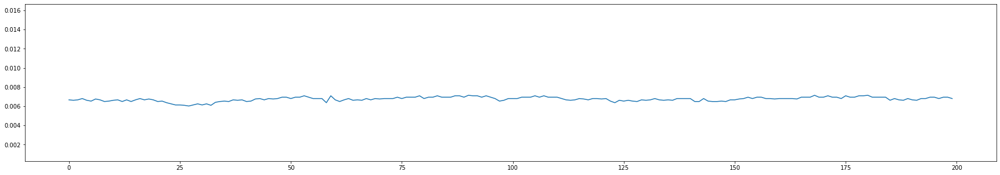

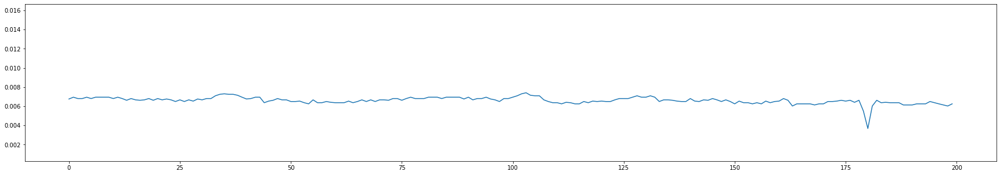

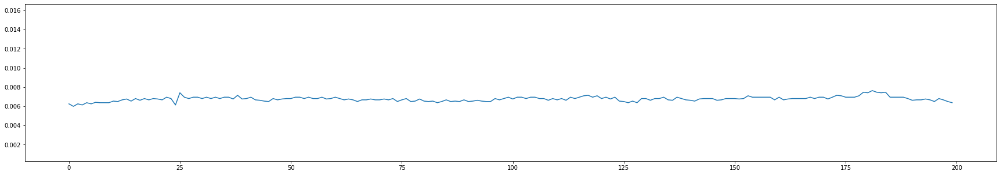

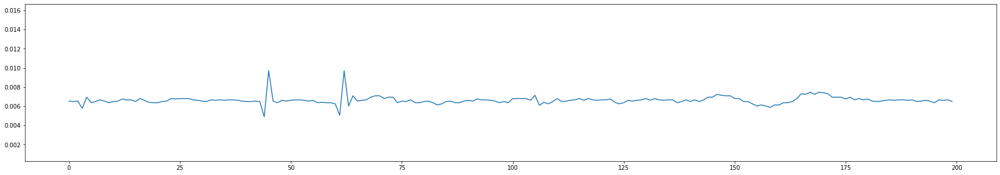

...

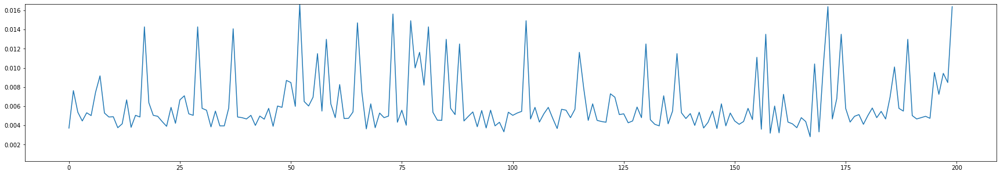

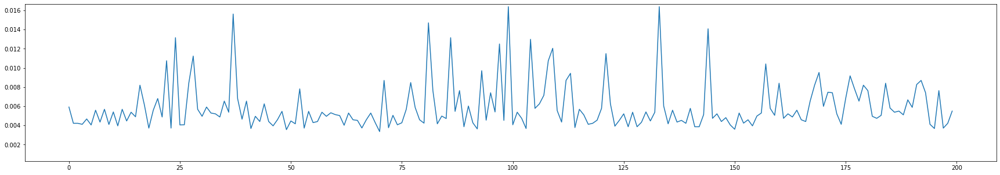

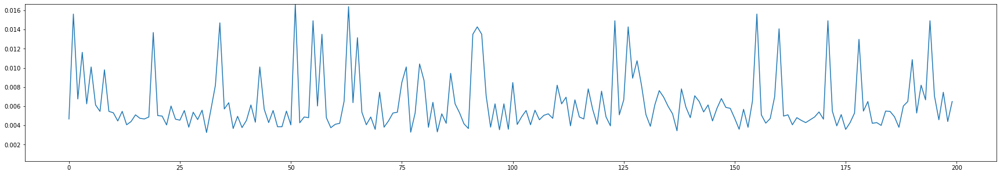

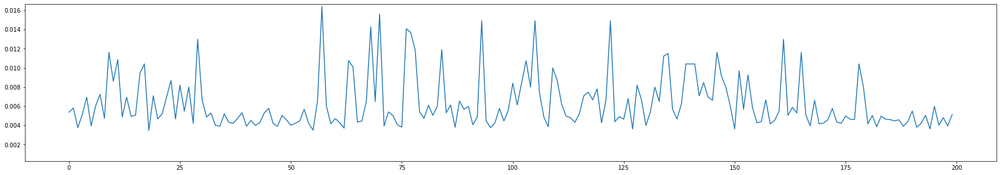

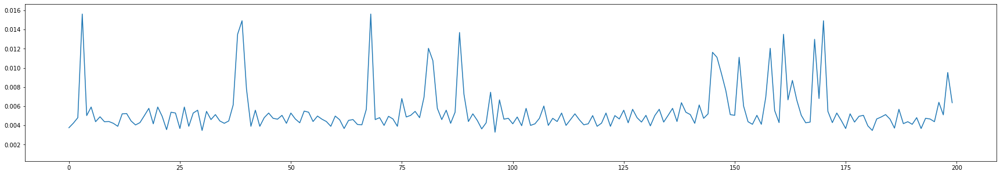

In [6]:
k = [n for n in range(0, 27364, 200)]

for start, end in zip(k[:-1], k[1:]):

    plt.figure(figsize=(30,5))
    plt.plot(HRV[start:end])
    plt.ylim([HRV.min(), HRV.max()])
    plt.show()